In [1]:
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

from datetime import timedelta, datetime
#import holidays

import matplotlib
import seaborn as sns
import pickle

In [2]:
import plotly.graph_objs as go
import plotly.figure_factory as ff
import plotly.offline as py

py.init_notebook_mode(connected=True)

In [3]:
matplotlib.pyplot.style.use('ggplot')
%matplotlib inline

In [12]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.float_format', lambda x: '%.3f' % x)
pd.set_option('display.width', 500)

**Data Preview**

In [4]:
targets_train = pd.read_csv('../data/targets_train.csv')
uf_test = pd.read_csv('../data/user_features_test.csv')
uf_train = pd.read_csv('../data/user_features_train.csv')
users_test = pd.read_csv('../data/users_test.csv')
users_train = pd.read_csv('../data/users_train.csv')

In [6]:
users_train.shape

(878594, 11)

In [7]:
users_test.shape

(585730, 11)

In [8]:
uf_train.shape

(878594, 76)

In [9]:
uf_test.shape

(585730, 76)

In [10]:
targets_train.shape

(878594, 2)

In [5]:
df_train = pd.merge(targets_train, users_train, on='ID')

In [6]:
df_train = pd.merge(df_train, uf_train, on='ID')

In [13]:
df_train.shape

(878594, 87)

In [7]:
df_test = pd.merge(users_test, uf_test, on='ID')

In [15]:
df_test.shape

(585730, 86)

In [16]:
df_train.head()

,ID,TARGET,first_open_date,first_open_timestamp,local_first_open_timestamp,country,platform,device_category,device_brand,device_model,has_ios_att_permission,ad_network,first_prediction,RetentionD0,RetentionD1,RetentionD2,RetentionD3,RetentionD4,RetentionD5,RetentionD6,RetentionD7,RetentionD8,RetentionD9,RetentionD10,RetentionD11,RetentionD12,RetentionD13,RetentionD14,RetentionD15,LevelAdvancedCountD0,LevelAdvancedCountD1,LevelAdvancedCountD2,LevelAdvancedCountD3,LevelAdvancedCountD4,LevelAdvancedCountD5,LevelAdvancedCountD6,LevelAdvancedCountD7,LevelAdvancedCountD8,LevelAdvancedCountD9,LevelAdvancedCountD10,LevelAdvancedCountD11,LevelAdvancedCountD12,LevelAdvancedCountD13,LevelAdvancedCountD14,LevelAdvancedCountD15,Level_1_Duration,Level_2_Duration,Level_3_Duration,Level_4_Duration,Level_5_Duration,Level_6_Duration,Level_7_Duration,Level_8_Duration,Level_9_Duration,Level_10_Duration,AdRevenueD0,AdRevenueD1,AdRevenueD2,AdRevenueD3,AdRevenueD4,AdRevenueD5,AdRevenueD6,AdRevenueD7,AdRevenueD8,AdRevenueD9,AdRevenueD10,AdRevenueD11,AdRevenueD12,AdRevenueD13,AdRevenueD14,AdRevenueD15,IAPRevenueD0,IAPRevenueD1,IAPRevenueD2,IAPRevenueD3,IAPRevenueD4,IAPRevenueD5,IAPRevenueD6,IAPRevenueD7,IAPRevenueD8,IAPRevenueD9,IAPRevenueD10,IAPRevenueD11,IAPRevenueD12,IAPRevenueD13,IAPRevenueD14,IAPRevenueD15
0,0,0.000,2024-03-02,1709355895042000,1709334295042000,Mexico,Android,mobile,Xiaomi,Redmi A2,False,unityads_int,3.314,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,26.000,69.000,36.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
1,1,0.019,2024-03-19,1710824539731000,1710806539731000,Peru,Android,mobile,Samsung,Galaxy A13,False,applovin_int,1.682,True,False,False,False,False,False,True,True,False,True,False,False,False,False,False,False,5,0,0,0,0,0,3,5,0,2,0,0,0,0,0,0,13.000,91.000,39.000,79.000,180.000,89.000,124.000,118.000,35.000,117.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.009,0.000,0.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
2,2,0.000,2024-03-18,1710731043082000,1710720243082000,Brazil,Android,mobile,Xiaomi,Redmi 12,False,applovin_int,10.719,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,8.000,63.000,86.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
3,3,0.047,2024-03-03,1709455862260000,1709441462260000,Dominican Republic,iOS,mobile,Apple,iPhone 11 Pro Max,False,NaN,5.100,True,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,19,8,9,0,0,0,0,0,0,0,0,0,0,0,0,0,23.000,141.000,131.000,118.000,77.000,107.000,77.000,182.000,42.000,156.000,0.002,0.019,0.025,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
4,4,0.015,2024-04-30,1714482477190000,1714464477190000,Ecuador,Android,mobile,Motorola,Moto E22,False,applovin_int,2.091,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,15,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,8.000,52.000,30.000,84.000,139.000,96.000,268.000,97.000,44.000,122.000,0.015,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


In [17]:
df_test.head()

,ID,first_open_date,first_open_timestamp,local_first_open_timestamp,country,platform,device_category,device_brand,device_model,has_ios_att_permission,ad_network,first_prediction,RetentionD0,RetentionD1,RetentionD2,RetentionD3,RetentionD4,RetentionD5,RetentionD6,RetentionD7,RetentionD8,RetentionD9,RetentionD10,RetentionD11,RetentionD12,RetentionD13,RetentionD14,RetentionD15,LevelAdvancedCountD0,LevelAdvancedCountD1,LevelAdvancedCountD2,LevelAdvancedCountD3,LevelAdvancedCountD4,LevelAdvancedCountD5,LevelAdvancedCountD6,LevelAdvancedCountD7,LevelAdvancedCountD8,LevelAdvancedCountD9,LevelAdvancedCountD10,LevelAdvancedCountD11,LevelAdvancedCountD12,LevelAdvancedCountD13,LevelAdvancedCountD14,LevelAdvancedCountD15,Level_1_Duration,Level_2_Duration,Level_3_Duration,Level_4_Duration,Level_5_Duration,Level_6_Duration,Level_7_Duration,Level_8_Duration,Level_9_Duration,Level_10_Duration,AdRevenueD0,AdRevenueD1,AdRevenueD2,AdRevenueD3,AdRevenueD4,AdRevenueD5,AdRevenueD6,AdRevenueD7,AdRevenueD8,AdRevenueD9,AdRevenueD10,AdRevenueD11,AdRevenueD12,AdRevenueD13,AdRevenueD14,AdRevenueD15,IAPRevenueD0,IAPRevenueD1,IAPRevenueD2,IAPRevenueD3,IAPRevenueD4,IAPRevenueD5,IAPRevenueD6,IAPRevenueD7,IAPRevenueD8,IAPRevenueD9,IAPRevenueD10,IAPRevenueD11,IAPRevenueD12,IAPRevenueD13,IAPRevenueD14,IAPRevenueD15
0,878594,2024-05-12,1715478163668000,1715467363668000,Argentina,Android,mobile,Motorola,Moto G32,False,applovin_int,1.445,True,True,True,True,True,False,False,False,False,False,False,False,False,False,False,False,10,5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,16.000,147.000,81.000,68.000,265.000,184.000,142.000,133.000,59.000,157.000,0.002,0.009,0.002,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
1,878595,2024-01-26,1706254855890000,1706233255890000,Mexico,Android,mobile,OnePlus,Nord N20 SE,False,applovin_int,9.148,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,17.000,209.000,84.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
2,878596,2024-02-13,1707778260263000,1707781860263000,France,Android,mobile,Motorola,moto g13,False,applovin_int,40.731,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,19.000,73.000,130.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
3,878597,2024-02-21,1708530744695000,1708519944695000,Brazil,Android,mobile,Samsung,Galaxy A03,False,applovin_int,4.968,True,False,False,True,False,True,True,False,True,True,False,False,False,False,False,False,2,0,0,1,0,4,13,0,2,0,0,0,0,0,0,0,66.000,896.000,562.000,840.000,412.000,1001.000,530.000,536.000,85.000,562.000,0.000,0.000,0.000,0.000,0.000,0.000,0.156,0.000,0.112,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
4,878598,2024-05-03,1714706093405000,1714688093405000,Peru,Android,mobile,Xiaomi,Redmi 13C,False,applovin_int,2.446,True,False,True,True,True,True,False,False,False,False,False,False,False,False,False,False,21,0,5,18,26,9,0,0,0,0,0,0,0,0,0,0,32.000,99.000,38.000,46.000,175.000,48.000,72.000,59.000,37.000,69.000,0.000,0.000,0.004,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


In [18]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 878594 entries, 0 to 878593
Data columns (total 87 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   ID                          878594 non-null  int64  
 1   TARGET                      878594 non-null  float64
 2   first_open_date             878594 non-null  object 
 3   first_open_timestamp        878594 non-null  int64  
 4   local_first_open_timestamp  878594 non-null  int64  
 5   country                     878512 non-null  object 
 6   platform                    878594 non-null  object 
 7   device_category             878594 non-null  object 
 8   device_brand                872754 non-null  object 
 9   device_model                878594 non-null  object 
 10  has_ios_att_permission      878594 non-null  bool   
 11  ad_network                  568124 non-null  object 
 12  first_prediction            852859 non-null  float64
 13  RetentionD0   

In [19]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 585730 entries, 0 to 585729
Data columns (total 86 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   ID                          585730 non-null  int64  
 1   first_open_date             585730 non-null  object 
 2   first_open_timestamp        585730 non-null  int64  
 3   local_first_open_timestamp  585730 non-null  int64  
 4   country                     585674 non-null  object 
 5   platform                    585730 non-null  object 
 6   device_category             585730 non-null  object 
 7   device_brand                581803 non-null  object 
 8   device_model                585730 non-null  object 
 9   has_ios_att_permission      585730 non-null  bool   
 10  ad_network                  379139 non-null  object 
 11  first_prediction            568452 non-null  float64
 12  RetentionD0                 585730 non-null  bool   
 13  RetentionD1   

In [20]:
df_train.describe()

,ID,TARGET,first_open_timestamp,local_first_open_timestamp,first_prediction,LevelAdvancedCountD0,LevelAdvancedCountD1,LevelAdvancedCountD2,LevelAdvancedCountD3,LevelAdvancedCountD4,LevelAdvancedCountD5,LevelAdvancedCountD6,LevelAdvancedCountD7,LevelAdvancedCountD8,LevelAdvancedCountD9,LevelAdvancedCountD10,LevelAdvancedCountD11,LevelAdvancedCountD12,LevelAdvancedCountD13,LevelAdvancedCountD14,LevelAdvancedCountD15,Level_1_Duration,Level_2_Duration,Level_3_Duration,Level_4_Duration,Level_5_Duration,Level_6_Duration,Level_7_Duration,Level_8_Duration,Level_9_Duration,Level_10_Duration,AdRevenueD0,AdRevenueD1,AdRevenueD2,AdRevenueD3,AdRevenueD4,AdRevenueD5,AdRevenueD6,AdRevenueD7,AdRevenueD8,AdRevenueD9,AdRevenueD10,AdRevenueD11,AdRevenueD12,AdRevenueD13,AdRevenueD14,AdRevenueD15,IAPRevenueD0,IAPRevenueD1,IAPRevenueD2,IAPRevenueD3,IAPRevenueD4,IAPRevenueD5,IAPRevenueD6,IAPRevenueD7,IAPRevenueD8,IAPRevenueD9,IAPRevenueD10,IAPRevenueD11,IAPRevenueD12,IAPRevenueD13,IAPRevenueD14,IAPRevenueD15
count,878594.000,878594.000,878594.000,878594.000,852859.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,872494.000,828188.000,790654.000,728697.000,686832.000,649367.000,609764.000,577358.000,559933.000,522605.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000,878594.000
mean,439296.500,0.511,1710305542815752.500,1710299336943530.250,37.612,11.127,4.750,3.174,2.521,2.123,1.863,1.691,1.577,1.380,1.247,1.166,1.098,1.037,1.008,0.977,0.903,29.842,116.582,106.351,139.051,137.652,154.479,168.807,160.801,76.040,164.556,0.101,0.047,0.029,0.022,0.018,0.016,0.014,0.013,0.011,0.010,0.009,0.008,0.008,0.008,0.008,0.007,0.001,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
std,253628.386,2.759,3554135687468.454,3553597616889.886,87.799,13.652,13.057,10.361,9.229,8.402,7.849,7.451,7.265,6.700,6.353,6.172,6.105,5.896,5.814,5.734,5.541,1493.786,210.042,190.209,246.798,248.117,240.476,285.431,246.002,681.195,250.943,0.456,0.274,0.195,0.167,0.149,0.135,0.135,0.121,0.118,0.108,0.118,0.116,0.105,0.117,0.093,0.081,0.056,0.038,0.024,0.020,0.016,0.017,0.013,0.016,0.012,0.014,0.009,0.011,0.009,0.010,0.011,0.014
min,0.000,0.000,1704056429503000.000,1704027587605000.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,2.000,2.000,3.000,2.000,2.000,2.000,3.000,2.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
25%,219648.250,0.000,1707209430364750.000,1707209128389000.000,3.933,3.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,11.000,37.000,40.000,51.000,49.000,62.000,70.000,68.000,40.000,77.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
50%,439296.500,0.036,1710289045097000.000,1710280172556000.000,11.415,7.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,16.000,73.000,69.000,90.000,91.000,109.000,118.000,116.000,53.000,123.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
75%,658944.750,0.269,1713502528776500.000,1713488410002000.000,35.876,14.000,3.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,

In [21]:
df_train.describe(include = [object])

,first_open_date,country,platform,device_category,device_brand,device_model,ad_network
count,878594,878512,878594,878594,872754,878594,568124
unique,139,221,2,2,295,4504,7
top,2024-01-31,United States,Android,mobile,Apple,iPhone 11,applovin_int
freq,10329,114723,514971,794214,363623,52461,520202


In [22]:
df_test.describe()

,ID,first_open_timestamp,local_first_open_timestamp,first_prediction,LevelAdvancedCountD0,LevelAdvancedCountD1,LevelAdvancedCountD2,LevelAdvancedCountD3,LevelAdvancedCountD4,LevelAdvancedCountD5,LevelAdvancedCountD6,LevelAdvancedCountD7,LevelAdvancedCountD8,LevelAdvancedCountD9,LevelAdvancedCountD10,LevelAdvancedCountD11,LevelAdvancedCountD12,LevelAdvancedCountD13,LevelAdvancedCountD14,LevelAdvancedCountD15,Level_1_Duration,Level_2_Duration,Level_3_Duration,Level_4_Duration,Level_5_Duration,Level_6_Duration,Level_7_Duration,Level_8_Duration,Level_9_Duration,Level_10_Duration,AdRevenueD0,AdRevenueD1,AdRevenueD2,AdRevenueD3,AdRevenueD4,AdRevenueD5,AdRevenueD6,AdRevenueD7,AdRevenueD8,AdRevenueD9,AdRevenueD10,AdRevenueD11,AdRevenueD12,AdRevenueD13,AdRevenueD14,AdRevenueD15,IAPRevenueD0,IAPRevenueD1,IAPRevenueD2,IAPRevenueD3,IAPRevenueD4,IAPRevenueD5,IAPRevenueD6,IAPRevenueD7,IAPRevenueD8,IAPRevenueD9,IAPRevenueD10,IAPRevenueD11,IAPRevenueD12,IAPRevenueD13,IAPRevenueD14,IAPRevenueD15
count,585730.000,585730.000,585730.000,568452.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,581507.000,551909.000,526981.000,485611.000,457968.000,432622.000,406469.000,385281.000,373637.000,348570.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000,585730.000
mean,1171458.500,1710307261614901.250,1710301046976073.750,37.540,11.149,4.742,3.185,2.513,2.123,1.881,1.698,1.577,1.390,1.252,1.167,1.090,1.042,1.009,0.979,0.891,28.313,116.344,106.516,139.143,138.187,154.383,168.984,161.604,75.547,164.670,0.101,0.047,0.030,0.022,0.018,0.016,0.014,0.013,0.011,0.010,0.009,0.008,0.008,0.008,0.007,0.006,0.001,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
std,169085.831,3554277034462.501,3553715170269.566,87.649,13.660,12.960,10.421,9.162,8.334,7.895,7.455,7.311,6.746,6.413,6.311,5.972,6.028,5.885,5.732,5.471,881.947,188.877,198.835,248.630,266.806,239.175,286.134,284.665,196.889,242.254,0.448,0.272,0.212,0.168,0.153,0.141,0.123,0.122,0.131,0.102,0.099,0.095,0.099,0.098,0.087,0.085,0.045,0.047,0.031,0.018,0.017,0.013,0.014,0.012,0.015,0.012,0.016,0.020,0.017,0.014,0.008,0.012
min,878594.000,1704056428261000.000,1704027979735000.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,2.000,1.000,3.000,3.000,1.000,2.000,1.000,2.000,2.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
25%,1025026.250,1707210139843250.000,1707210847233000.000,3.905,3.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,11.000,37.000,40.000,51.000,49.000,62.000,70.000,68.000,40.000,77.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
50%,1171458.500,1710289000369000.000,1710280135727500.000,11.311,7.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,16.000,73.000,69.000,90.000,90.000,109.000,118.000,116.000,53.000,123.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
75%,1317890.750,1713505194856500.000,1713493962901250.000,35.612,14.000,3.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,24.000,137.000,127.000,162.000,162

In [23]:
df_test.describe(include = [object])

,first_open_date,country,platform,device_category,device_brand,device_model,ad_network
count,585730,585674,585730,585730,581803,585730,379139
unique,139,217,2,2,251,4015,6
top,2024-01-31,United States,Android,mobile,Apple,iPhone 11,applovin_int
freq,6930,76248,344006,529800,241724,34679,347306


In [16]:
users_train.head()

,ID,first_open_date,first_open_timestamp,local_first_open_timestamp,country,platform,device_category,device_brand,device_model,has_ios_att_permission,ad_network
0,0,2024-03-02,1709355895042000,1709334295042000,Mexico,Android,mobile,Xiaomi,Redmi A2,False,unityads_int
1,1,2024-03-19,1710824539731000,1710806539731000,Peru,Android,mobile,Samsung,Galaxy A13,False,applovin_int
2,2,2024-03-18,1710731043082000,1710720243082000,Brazil,Android,mobile,Xiaomi,Redmi 12,False,applovin_int
3,3,2024-03-03,1709455862260000,1709441462260000,Dominican Republic,iOS,mobile,Apple,iPhone 11 Pro Max,False,NaN
4,4,2024-04-30,1714482477190000,1714464477190000,Ecuador,Android,mobile,Motorola,Moto E22,False,applovin_int


In [17]:
uf_train.head()

,ID,first_prediction,RetentionD0,RetentionD1,RetentionD2,RetentionD3,RetentionD4,RetentionD5,RetentionD6,RetentionD7,RetentionD8,RetentionD9,RetentionD10,RetentionD11,RetentionD12,RetentionD13,RetentionD14,RetentionD15,LevelAdvancedCountD0,LevelAdvancedCountD1,LevelAdvancedCountD2,LevelAdvancedCountD3,LevelAdvancedCountD4,LevelAdvancedCountD5,LevelAdvancedCountD6,LevelAdvancedCountD7,LevelAdvancedCountD8,LevelAdvancedCountD9,LevelAdvancedCountD10,LevelAdvancedCountD11,LevelAdvancedCountD12,LevelAdvancedCountD13,LevelAdvancedCountD14,LevelAdvancedCountD15,Level_1_Duration,Level_2_Duration,Level_3_Duration,Level_4_Duration,Level_5_Duration,Level_6_Duration,Level_7_Duration,Level_8_Duration,Level_9_Duration,Level_10_Duration,AdRevenueD0,AdRevenueD1,AdRevenueD2,AdRevenueD3,AdRevenueD4,AdRevenueD5,AdRevenueD6,AdRevenueD7,AdRevenueD8,AdRevenueD9,AdRevenueD10,AdRevenueD11,AdRevenueD12,AdRevenueD13,AdRevenueD14,AdRevenueD15,IAPRevenueD0,IAPRevenueD1,IAPRevenueD2,IAPRevenueD3,IAPRevenueD4,IAPRevenueD5,IAPRevenueD6,IAPRevenueD7,IAPRevenueD8,IAPRevenueD9,IAPRevenueD10,IAPRevenueD11,IAPRevenueD12,IAPRevenueD13,IAPRevenueD14,IAPRevenueD15
0,0,3.314,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,26.000,69.000,36.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
1,1,1.682,True,False,False,False,False,False,True,True,False,True,False,False,False,False,False,False,5,0,0,0,0,0,3,5,0,2,0,0,0,0,0,0,13.000,91.000,39.000,79.000,180.000,89.000,124.000,118.000,35.000,117.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.009,0.000,0.010,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
2,2,10.719,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,8.000,63.000,86.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
3,3,5.100,True,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,19,8,9,0,0,0,0,0,0,0,0,0,0,0,0,0,23.000,141.000,131.000,118.000,77.000,107.000,77.000,182.000,42.000,156.000,0.002,0.019,0.025,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
4,4,2.091,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,15,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,8.000,52.000,30.000,84.000,139.000,96.000,268.000,97.000,44.000,122.000,0.015,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


In [18]:
uf_train[['ID', 'first_prediction']].head()

,ID,first_prediction
0,0,3.314
1,1,1.682
2,2,10.719
3,3,5.100
4,4,2.091


In [8]:
users_train = pd.merge(users_train, uf_train[['ID', 'first_prediction']], on='ID')

In [20]:
users_train.head()

,ID,first_open_date,first_open_timestamp,local_first_open_timestamp,country,platform,device_category,device_brand,device_model,has_ios_att_permission,ad_network,first_prediction
0,0,2024-03-02,1709355895042000,1709334295042000,Mexico,Android,mobile,Xiaomi,Redmi A2,False,unityads_int,3.314
1,1,2024-03-19,1710824539731000,1710806539731000,Peru,Android,mobile,Samsung,Galaxy A13,False,applovin_int,1.682
2,2,2024-03-18,1710731043082000,1710720243082000,Brazil,Android,mobile,Xiaomi,Redmi 12,False,applovin_int,10.719
3,3,2024-03-03,1709455862260000,1709441462260000,Dominican Republic,iOS,mobile,Apple,iPhone 11 Pro Max,False,NaN,5.100
4,4,2024-04-30,1714482477190000,1714464477190000,Ecuador,Android,mobile,Motorola,Moto E22,False,applovin_int,2.091


<Axes: >

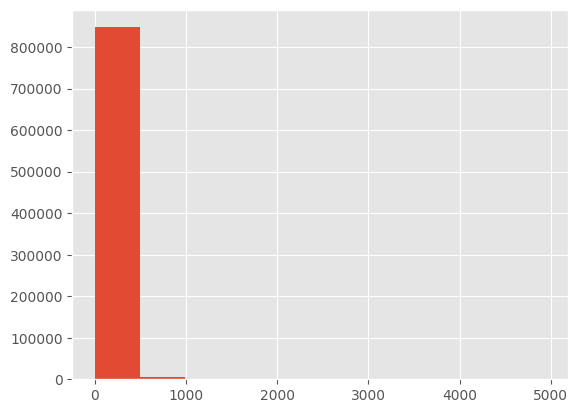

In [21]:
users_train['first_prediction'].hist()

In [9]:
users_train['first_prediction'].describe()

count    852859.000000
mean         37.612360
std          87.799145
min           0.000100
25%           3.932556
50%          11.414559
75%          35.876447
max        4944.476604
Name: first_prediction, dtype: float64

In [13]:
users_train['first_prediction'].value_counts()

first_prediction
63.000      15216
95.000      14395
31.000      13698
46.000      12695
15.000      12064
22.000      11900
10.000       8881
150.000      8628
3.500        7786
1.100        6095
1.800        4478
5.100        3435
0.600        3199
6.000        2625
8.000        2006
5.000        1998
18.000       1920
3.000        1791
25.000       1652
12.000       1594
1.500        1311
20.000       1174
11.000       1106
0.350        1080
4.750         947
24.000        917
7.500         907
26.000        901
165.000       879
2.200         831
9.500         792
42.000        790
30.500        773
45.000        749
32.000        702
7.600         666
19.000        641
72.000        600
0.500         589
30.000        559
7.000         559
15.200        549
1.000         544
5.700         489
2.000         462
1.200         453
11.500        452
75.000        451
2.250         436
0.700         427
80.000        419
50.000        392
1.900         389
100.000       383
17.000     

In [30]:
len(users_train['first_prediction'].value_counts())

600104

In [11]:
len(users_train['first_prediction'].value_counts())

600104

In [16]:
users_train[round(users_train['first_prediction'], 3) == 63.000].head()

,ID,first_open_date,first_open_timestamp,local_first_open_timestamp,country,platform,device_category,device_brand,device_model,has_ios_att_permission,ad_network,first_prediction
10,10,2024-02-06,1707168810317000,1707140010317000,United States,iOS,mobile,Apple,iPhone SE (2nd generation),True,applovin_int,63.000
12,12,2024-05-04,1714783839460000,1714791039460000,Germany,iOS,mobile,Apple,iPhone 14 Pro Max,False,applovin_int,63.000
18,18,2024-04-07,1712496449028000,1712503649028000,Germany,iOS,mobile,Apple,iPhone 13 Pro,False,NaN,63.000
73,73,2024-02-05,1707111246281000,1707089646281000,United States,iOS,mobile,Apple,iPhone 14,False,applovin_int,63.000
74,74,2024-03-13,1710355294824000,1710340894824000,United States,iOS,tablet,Apple,iPad Pro (11-inch),False,applovin_int,63.000


In [29]:
users_train['device_brand'].value_counts()

device_brand
Apple                363623
Samsung              225831
Xiaomi                82158
Motorola              76009
OPPO                  22920
Vivo                  14418
Huawei                13083
Honor                 12594
Realme                12160
Tecno                  8683
Infinix                7491
OnePlus                5780
ZTE                    4032
Lenovo                 3610
LG                     3217
Google                 3210
TCL                    2937
Nokia                  1290
POCO                    941
T-Mobile                704
Alcatel                 561
BLU                     524
Asus                    415
Sony                    393
Cubot                   319
DOOGEE                  299
itel                    285
Blackview               284
ONN                     264
Hisense                 243
Umidigi                 211
Wiko                    205
Sky Devices             179
Nothing                 148
Reeder                  140
Maxwest

In [31]:
len(users_train['device_brand'].value_counts())

295

In [32]:
600104/295

2034.250847457627

In [17]:
users_train[round(users_train['first_prediction'], 3) == 63.000]['device_brand'].value_counts()

device_brand
Apple       15177
Samsung        22
Xiaomi          5
Motorola        4
OPPO            2
Vortex          1
Vivo            1
Honor           1
Lenovo          1
OnePlus         1
Teclast         1
Google          1
Name: count, dtype: int64

In [18]:
users_train[(round(users_train['first_prediction'], 3) == 63.000) & (users_train['device_brand']=='Samsung')]

,ID,first_open_date,first_open_timestamp,local_first_open_timestamp,country,platform,device_category,device_brand,device_model,has_ios_att_permission,ad_network,first_prediction
9814,9814,2024-02-06,1707225286086000,1707232486086000,Romania,Android,mobile,Samsung,Galaxy Note10+,False,applovin_int,63.000
139025,139025,2024-01-10,1704851773887000,1704840973887000,Brazil,Android,mobile,Samsung,Galaxy A34,False,applovin_int,63.000
218887,218887,2024-05-18,1716014361812000,1716046761812000,South Korea,Android,mobile,Samsung,Galaxy Z Fold4,False,applovin_int,63.000
246334,246334,2024-03-23,1711223713179000,1711227313179000,Switzerland,Android,mobile,Samsung,Galaxy S23 Ultra,False,NaN,63.000
254711,254711,2024-04-20,1713610465653000,1713596065653000,United States,Android,mobile,Samsung,Galaxy A15 5G,False,applovin_int,63.000
287376,287376,2024-01-09,1704814139460000,1704803339460000,Brazil,Android,mobile,Samsung,Galaxy A30s,False,applovin_int,63.000
291992,291992,2024-05-14,1715687258870000,1715694458870000,Austria,Android,mobile,Samsung,Galaxy S22 Ultra,False,applovin_int,63.000
319719,319719,2024-02-17,1708186263605000,1708189863605000,Germany,Android,mobile,Samsung,Galaxy M53,False,applovin_int,63.000
379599,379599,2024-04-08,1712570497671000,1712552497671000,United States,Android,mobile,Samsung,Galaxy A14 5G,False,applovin_int,63.000
414090,414090,2024-02-08,1707399142505000,1707402742505000,France,Android,mobile,Samsung,Galaxy A34,False,NaN,63.000


In [19]:
users_train[round(users_train['first_prediction'], 3) == 95.000].head()

,ID,first_open_date,first_open_timestamp,local_first_open_timestamp,country,platform,device_category,device_brand,device_model,has_ios_att_permission,ad_network,first_prediction
85,85,2024-02-24,1708739165782000,1708739165782000,United Kingdom,iOS,mobile,Apple,iPhone 14,True,applovin_int,95.000
122,122,2024-01-27,1706324091016000,1706302491016000,United States,iOS,mobile,Apple,iPhone 11 Pro Max,False,NaN,95.000
139,139,2024-04-10,1712724552247000,1712710152247000,United States,iOS,mobile,Apple,iPhone 14,False,applovin_int,95.000
145,145,2024-03-02,1709347569079000,1709325969079000,United States,iOS,mobile,Apple,iPhone 13 Pro Max,False,NaN,95.000
248,248,2024-03-04,1709518448518000,1709496848518000,United States,iOS,mobile,Apple,iPhone 14,False,NaN,95.000


In [20]:
users_train[round(users_train['first_prediction'], 3) == 95.000]['device_brand'].value_counts()

device_brand
Apple        14311
Samsung         48
Motorola         9
Xiaomi           7
OPPO             4
Honor            3
Realme           2
Google           2
ZTE              1
DOOGEE           1
Huawei           1
Oukitel          1
OnePlus          1
Lenovo           1
Blackview        1
Nokia            1
Teclast          1
T-Mobile         1
Name: count, dtype: int64

In [21]:
users_train[(round(users_train['first_prediction'], 3) == 95.000) & (users_train['device_brand']=='Samsung')]

,ID,first_open_date,first_open_timestamp,local_first_open_timestamp,country,platform,device_category,device_brand,device_model,has_ios_att_permission,ad_network,first_prediction
24100,24100,2024-05-13,1715565686694000,1715551286694000,Canada,Android,mobile,Samsung,Galaxy S21 FE 5G,False,applovin_int,95.000
28222,28222,2024-04-21,1713663447724000,1713649047724000,Canada,Android,mobile,Samsung,Galaxy S23 FE,False,applovin_int,95.000
37784,37784,2024-03-20,1710919798572000,1710898198572000,United States,Android,mobile,Samsung,Galaxy A14 5G,False,applovin_int,95.000
53845,53845,2024-03-05,1709594382996000,1709594382996000,Portugal,Android,mobile,Samsung,Galaxy A54,False,NaN,95.000
78167,78167,2024-03-28,1711609818343000,1711584618343000,United States,Android,mobile,Samsung,Galaxy A54,False,applovin_int,95.000
89920,89920,2024-03-24,1711277263254000,1711280863254000,Italy,Android,mobile,Samsung,Galaxy A51,False,NaN,95.000
125524,125524,2024-03-12,1710263508271000,1710249108271000,United States,Android,mobile,Samsung,Galaxy S23 Ultra,False,applovin_int,95.000
136994,136994,2024-03-10,1710039177234000,1710017577234000,Mexico,Android,mobile,Samsung,Galaxy A51,False,applovin_int,95.000
152734,152734,2024-03-26,1711446292162000,1711421092162000,United States,Android,mobile,Samsung,Galaxy S22 Ultra,False,applovin_int,95.000
224799,224799,2024-04-22,1713767940891000,1713796740891000,Australia,Android,mobile,Samsung,Galaxy S24 Ultra,False,unityads_int,95.000


In [22]:
users_train[(round(users_train['first_prediction'], 3) == 95.000) & (users_train['device_brand']=='Apple')]['country'].value_counts()

country
United States           9622
Germany                 1464
Switzerland              653
United Kingdom           500
Austria                  498
France                   390
Canada                   189
Australia                175
Italy                    142
Mexico                   106
Brazil                   105
Sweden                   104
Norway                    60
Indonesia                 41
Belgium                   27
Hungary                   23
Denmark                   20
Dominican Republic        16
Albania                   15
Puerto Rico               12
New Zealand               11
Spain                     10
Colombia                   7
Portugal                   7
Netherlands                6
United Arab Emirates       6
Argentina                  5
North Macedonia            5
Croatia                    4
Peru                       4
Egypt                      4
India                      4
Cyprus                     3
Philippines                3
Kosovo

<Axes: >

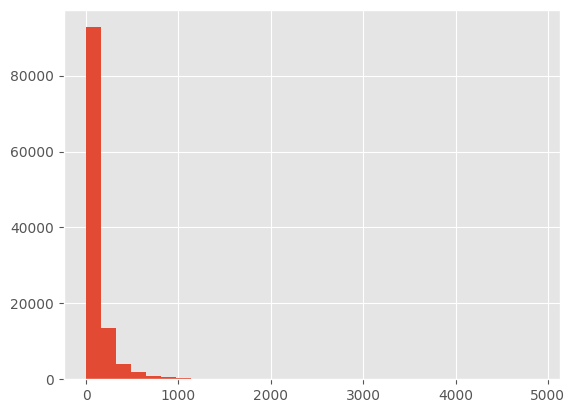

In [27]:
users_train[users_train['country'] == 'United States']['first_prediction'].hist(bins=30)

In [32]:
users_train[round(users_train['first_prediction'], 3) >= 1000.00].describe()

,ID,first_open_timestamp,local_first_open_timestamp,first_prediction
count,747.000,747.000,747.000,747.000
mean,439020.293,1712676269000194.000,1712662271409832.500,1513.924
std,254430.071,2754806754755.997,2754930173034.972,733.111
min,983.000,1704154894867000.000,1704136894867000.000,1000.000
25%,216537.500,1711044871888500.000,1711052938277000.000,1096.115
50%,435979.000,1713582583653000.000,1713563230789000.000,1243.278
75%,668802.500,1714684861071000.000,1714670461071000.000,1546.046
max,877418.000,1716052581510000.000,1716038181510000.000,4944.477


In [31]:
users_train[round(users_train['first_prediction'], 3) >= 2800.00]

,ID,first_open_date,first_open_timestamp,local_first_open_timestamp,country,platform,device_category,device_brand,device_model,has_ios_att_permission,ad_network,first_prediction
1479,1479,2024-04-29,1714363788709000,1714345788709000,United States,iOS,mobile,Apple,iPhone 11,True,NaN,2962.371
34380,34380,2024-04-21,1713697509788000,1713675909788000,United States,iOS,tablet,Apple,iPad Air (4th gen),True,applovin_int,3980.492
83556,83556,2024-05-15,1715784132084000,1715769732084000,Canada,iOS,tablet,Apple,iPad Air (4th gen),True,applovin_int,4885.405
87009,87009,2024-05-01,1714577393746000,1714552193746000,United States,iOS,mobile,Apple,iPhone 14,True,applovin_int,3673.932
89915,89915,2024-04-29,1714367295086000,1714342095086000,United States,iOS,tablet,Apple,iPad (8th gen),True,applovin_int,4796.494
136869,136869,2024-05-01,1714587781242000,1714562581242000,United States,iOS,tablet,Apple,iPad 6th gen,True,applovin_int,3247.326
181667,181667,2024-05-18,1716050213909000,1716035813909000,United States,iOS,mobile,Apple,iPhone 13,True,applovin_int,4217.495
188412,188412,2024-05-07,1715053037459000,1715038637459000,United States,iOS,tablet,Apple,iPad Air (3rd gen),True,applovin_int,4603.869
194934,194934,2024-04-19,1713489214920000,1713474814920000,United States,iOS,mobile,Apple,iPhone,True,applovin_int,3386.849
205273,205273,2024-05-10,1715301695290000,1715287295290000,United States,iOS,mobile,Apple,iPhone SE (2nd generation),True,applovin_int,3703.057


<Axes: >

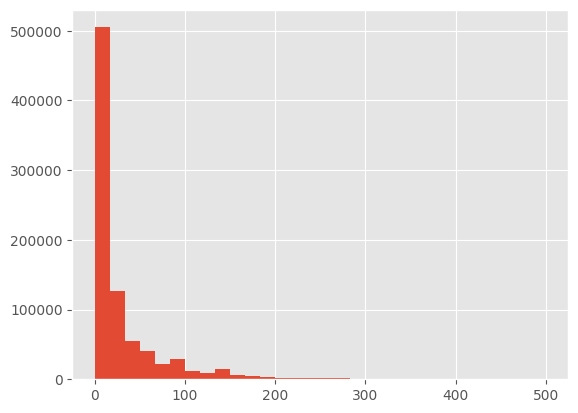

In [34]:
users_train[round(users_train['first_prediction'], 3) <= 500.00]['first_prediction'].hist(bins=30)

In [36]:
users_train['log_first_prediction'] = np.log(users_train['first_prediction'])

<Axes: >

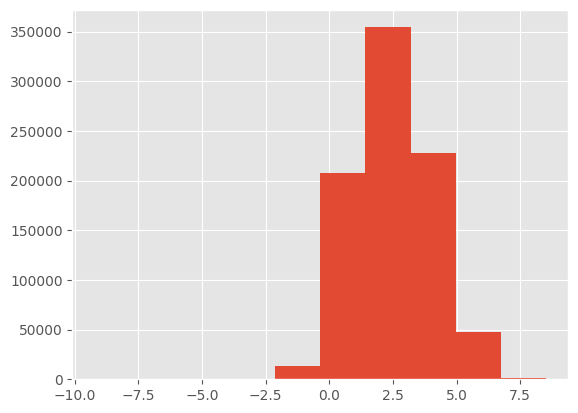

In [37]:
users_train['log_first_prediction'].hist()

In [42]:
users_train[(0.0 <= round(users_train['log_first_prediction'], 1)) & (round(users_train['log_first_prediction'], 1) <= 5.000)]['device_brand'].value_counts()

device_brand
Apple                341011
Samsung              196607
Xiaomi                73081
Motorola              70831
OPPO                  20382
Vivo                  12354
Honor                 11733
Huawei                11717
Realme                 9526
Tecno                  5821
Infinix                5518
OnePlus                5256
ZTE                    3676
Lenovo                 3213
LG                     2870
TCL                    2601
Google                 2310
Nokia                  1103
POCO                    862
T-Mobile                541
Alcatel                 448
BLU                     403
Asus                    367
Sony                    315
Cubot                   298
DOOGEE                  264
Blackview               253
Hisense                 216
ONN                     210
Wiko                    185
itel                    164
Umidigi                 159
Sky Devices             142
Nothing                 135
Ulefone                 113
Reeder 

In [44]:
users_train[(0.0 > round(users_train['log_first_prediction'], 1)) & (users_train['device_brand'] == 'Apple')]['device_model'].value_counts()

device_model
iPhone 11                                87
iPhone XR                                45
iPhone 7 Plus                            37
iPhone 8 Plus                            33
iPhone 13                                32
iPhone                                   28
iPhone 7                                 27
iPhone 12                                25
iPhone 8                                 20
iPhone X                                 19
iPhone 11 Pro Max                        17
iPhone 6s                                16
iPad (9th gen)                           14
iPhone XS Max                            13
iPhone 6                                 12
iPhone 13 Pro Max                        11
iPhone 12 Pro                            11
iPhone SE (2nd generation)               10
iPhone 6s Plus                            9
iPad Air (4th gen)                        9
iPhone 14                                 7
iPhone 11 Pro                             7
iPhone 14 Plus     